In [102]:
def plot_loss_curves(history):
    
    train_loss=history.history['loss']
    val_loss=history.history['val_loss']

    train_accuracy=history.history['acc']
    val_accuracy=history.history['val_acc']

    epochs=range(1,len(history.history['loss'])+1)
    plt.figure(figsize=(20,7))
    
  # plot loss 
    plt.subplot(1,2,1)
    plt.plot(epochs,train_loss,label="training_loss")
    plt.plot(epochs,val_loss,label="validation_loss")
    plt.title("Loss curves")
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()

  # plot accuracy 
    plt.subplot(1,2,2)
    plt.plot(epochs,train_accuracy,label="training_acc")
    plt.plot(epochs,val_accuracy,label="validation_acc")
    plt.title("Accuracy curves")
    plt.xlabel('epochs')
    plt.ylabel('Accuracy')
    plt.legend()

#### 1. Import modules

In [103]:
import os, shutil
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import cv2
import numpy as np
import random

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.models import load_model

# Field

#### 1. Import the data

In [73]:
cwd = os.getcwd()
data_dir = os.path.join(cwd,'data/Field')

In [4]:
data_dir

'/Users/eugeniulitvinenco/Desktop/university/Catolica/2 semester/4 trimester/ATPA/assignment/data/Field'

In [74]:
os.makedirs(os.path.join(cwd, 'split_field'), exist_ok=True)
train_dir = os.path.join(cwd, 'split_field/train')
test_dir = os.path.join(cwd, 'split_field/test')
val_dir = os.path.join(cwd, 'split_field/val')

In [75]:
categories = os.listdir(data_dir)

if ".DS_Store" in categories: categories.remove(".DS_Store") # form macs

for category in categories:
    os.makedirs(os.path.join(train_dir, category), exist_ok=True)
    os.makedirs(os.path.join(test_dir, category), exist_ok=True)
    os.makedirs(os.path.join(val_dir, category), exist_ok=True)
    
    files = os.listdir(os.path.join(data_dir, category))
    if ".DS_Store" in files: files.remove(".DS_Store") # form macs
    random.shuffle(files)
    
    split1 = int(0.7 * len(files))
    split2 = int(0.9 * len(files))
    
    train_files = files[:split1]
    val_files = files[split1:split2]
    test_files = files[split2:]
    
    for file in train_files:
        source_file = os.path.join(data_dir, category, file)
        dest_file = os.path.join(train_dir, category, file)
        shutil.copy(source_file, dest_file)
        
    for file in val_files:
        source_file = os.path.join(data_dir, category, file)
        dest_file = os.path.join(val_dir, category, file)
        shutil.copy(source_file, dest_file)
        
    for file in test_files:
        source_file = os.path.join(data_dir, category, file)
        dest_file = os.path.join(test_dir, category, file)
        shutil.copy(source_file, dest_file)

#### 2. Some plots

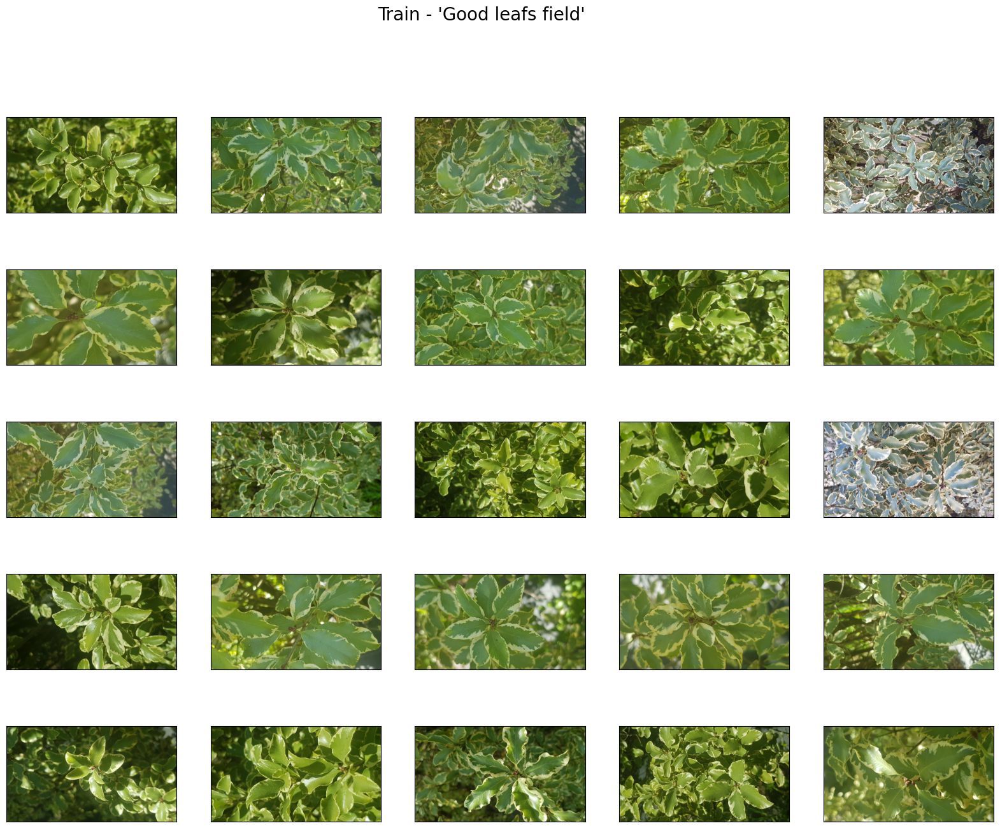

In [7]:
plt.figure(figsize=(20,15))
plt.suptitle("Train - 'Good leafs field' ", fontsize=20)
for i,img in enumerate(os.listdir(os.path.join(train_dir, 'Good leafs field'))):
        plt.subplot(5,5,i+1)
        full_image= plt.imread(os.path.join(train_dir,'Good leafs field',img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break

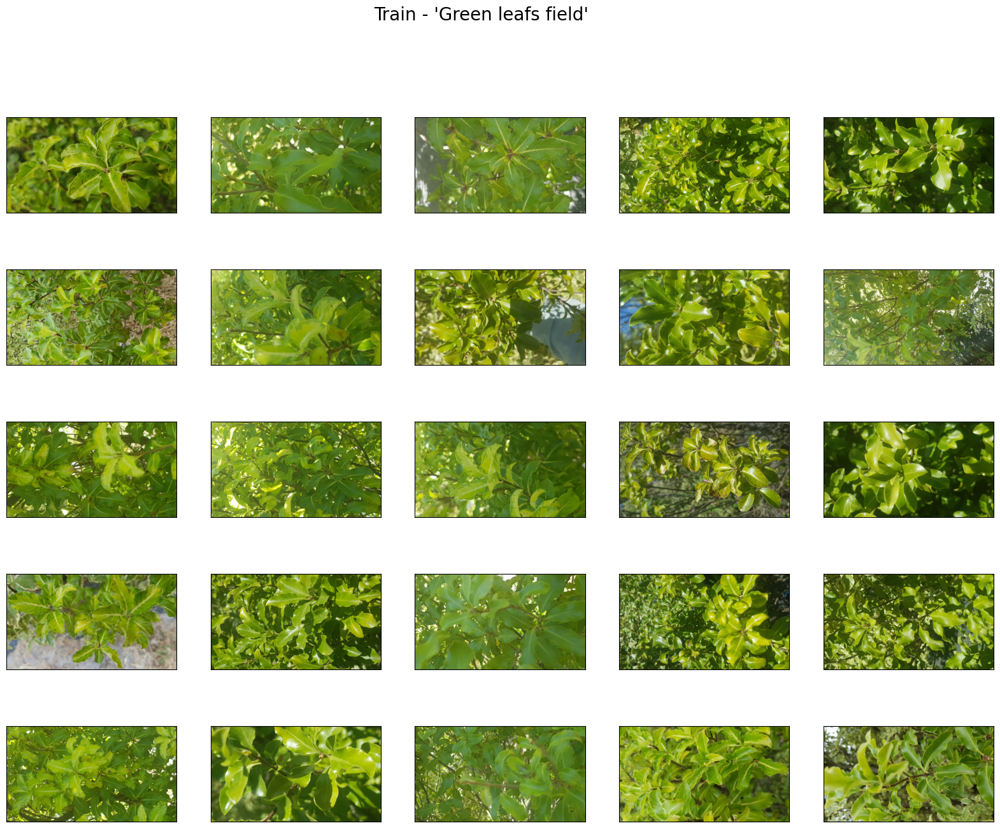

In [9]:
plt.figure(figsize=(20,15))
plt.suptitle("Train - 'Green leafs field' ", fontsize=20)
for i,img in enumerate(os.listdir(os.path.join(train_dir, 'Green leafs field'))):
        plt.subplot(5,5,i+1)
        full_image= plt.imread(os.path.join(train_dir,'Green leafs field',img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break
            

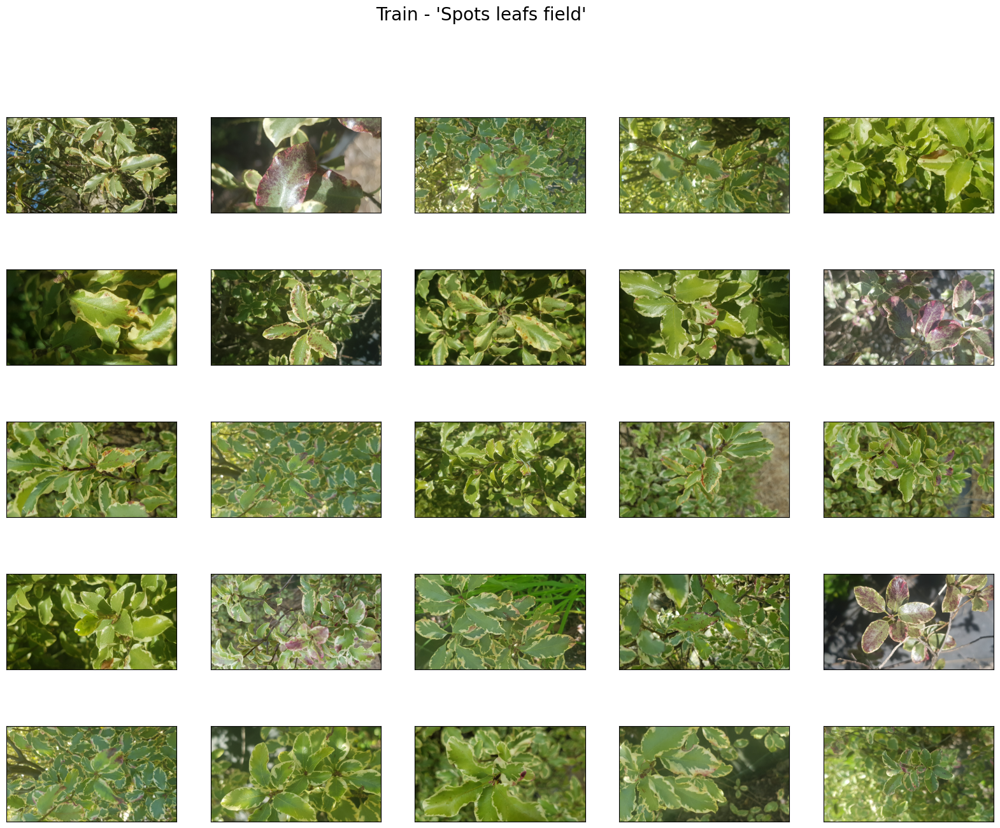

In [10]:
plt.figure(figsize=(20,15))
plt.suptitle("Train - 'Spots leafs field' ", fontsize=20)
for i,img in enumerate(os.listdir(os.path.join(train_dir, 'Spots leafs field'))):
        plt.subplot(5,5,i+1)
        full_image= plt.imread(os.path.join(train_dir,'Spots leafs field',img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break

#### 3. Model preparations

##### VGG16

In [76]:
from tensorflow.keras.applications import VGG16
import numpy as np

In [77]:
conv_base = VGG16(weights='imagenet', include_top = False, input_shape = (360,640,3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 360, 640, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 360, 640, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 360, 640, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 180, 320, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 180, 320, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 180, 320, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 90, 160, 128)      0     

##### Data augmentation - checking the train_datagen

In [84]:
train_datagen = ImageDataGenerator(
      rescale=1./255,
      #rotation_range=30,
      width_shift_range=1.01,
      height_shift_range=1.01,
      shear_range=1.01,
      zoom_range=[1,1.2],
     # brightness_range = [0.8, 1.2],
      horizontal_flip=True,
      fill_mode='reflect')

##### Plotting the augmented data

/Users/eugeniulitvinenco/Desktop/university/Catolica/2 semester/4 trimester/ATPA/assignment/split_field/train/Green leafs field/20230331_104047.jpg


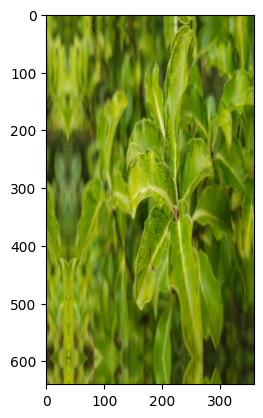

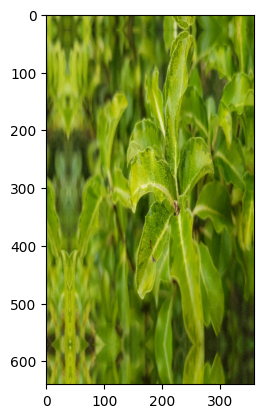

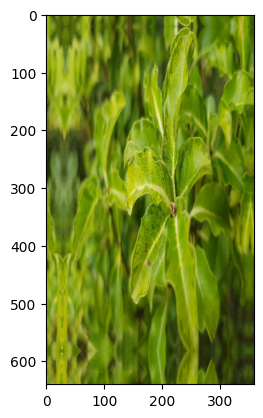

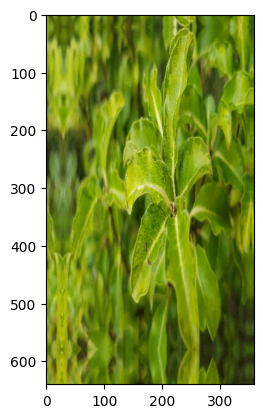

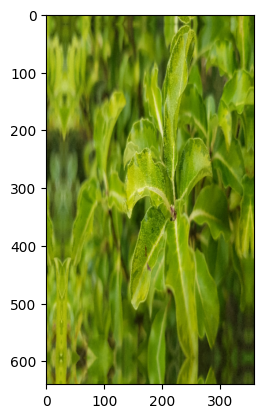

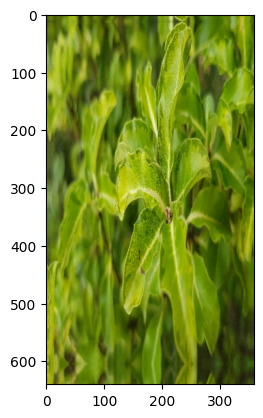

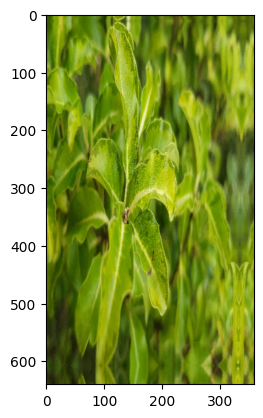

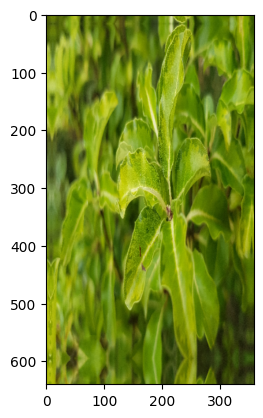

In [85]:
from tensorflow.keras.preprocessing import image
fnames = [os.path.join(train_dir, 'Green leafs field', fname) for
     fname in os.listdir(os.path.join(train_dir, 'Green leafs field'))]
img_path = fnames[0]
print(img_path)
img = image.load_img(img_path, target_size=(640, 360))
x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)
i = 0
for batch in train_datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 8 == 0:
        break
plt.show()

### VGG model + good network + data augmentation + unfreeze the last layer of VGG

In [86]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator


VGG16_model = models.Sequential()
VGG16_model.add(conv_base)
VGG16_model.add(layers.Flatten())
VGG16_model.add(layers.Dense(256, activation='relu'))
#VGG16_model.add(layers.Dense(32, activation='relu'))
VGG16_model.add(layers.Dense(3, activation='softmax'))

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(360, 640),
        batch_size=30,
        class_mode='categorical',
        classes = ['Good leafs field', 'Green leafs field', 'Spots leafs field'])

validation_generator = test_datagen.flow_from_directory(
        val_dir,
        target_size=(360, 640),
        batch_size=30,
        class_mode='categorical',
        classes = ['Good leafs field', 'Green leafs field', 'Spots leafs field'],)

conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

VGG16_model.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=0.0001),
              metrics=['acc'])


# number of samples in the training and validation sets
train_samples = len(train_generator.filenames)
val_samples = len(validation_generator.filenames)

# Set the batch size
batch_size = 30

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the callbacks
#early_stop = EarlyStopping(monitor='val_acc', patience=5)
model_checkpoint = ModelCheckpoint('best_model.h5', 
                                    save_best_only=True, 
                                    monitor='val_acc', 
                                    mode='max', 
                                    verbose=1)

# Train the model
history_VGG16 = VGG16_model.fit(
  train_generator,
  steps_per_epoch=steps_per_epoch,      
  epochs = 30,
  validation_data=validation_generator,
  validation_steps=validation_steps,
  callbacks=[model_checkpoint]
)

Found 227 images belonging to 3 classes.
Found 65 images belonging to 3 classes.
Epoch 1/30
7/7 [==============================] - ETA: 0s - loss: 2.7241 - acc: 0.3655 
Epoch 1: val_acc improved from -inf to 0.36667, saving model to best_model.h5
7/7 [==============================] - 142s 21s/step - loss: 2.7241 - acc: 0.3655 - val_loss: 1.1403 - val_acc: 0.3667
Epoch 2/30
7/7 [==============================] - ETA: 0s - loss: 1.1236 - acc: 0.3706 
Epoch 2: val_acc did not improve from 0.36667
7/7 [==============================] - 145s 21s/step - loss: 1.1236 - acc: 0.3706 - val_loss: 1.1340 - val_acc: 0.3000
Epoch 3/30
7/7 [==============================] - ETA: 0s - loss: 1.0626 - acc: 0.4213 
Epoch 3: val_acc improved from 0.36667 to 0.38333, saving model to best_model.h5
7/7 [==============================] - 150s 23s/step - loss: 1.0626 - acc: 0.4213 - val_loss: 1.0507 - val_acc: 0.3833
Epoch 4/30
7/7 [==============================] - ETA: 0s - loss: 0.8866 - acc: 0.5990 
Epoch

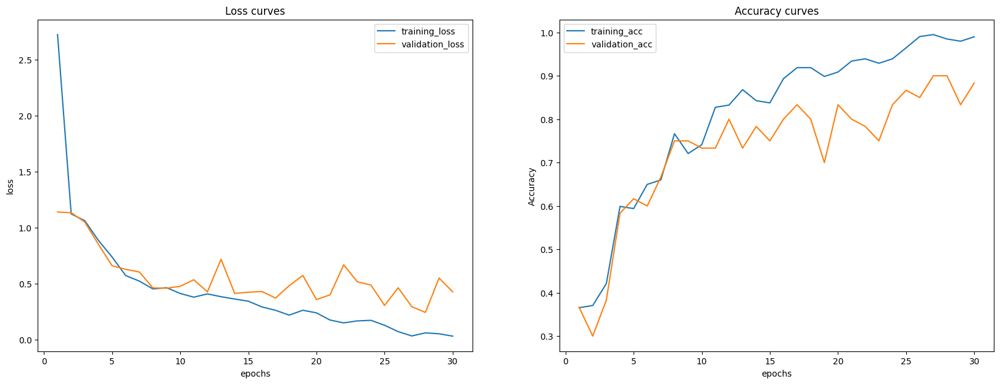

In [87]:
plot_loss_curves(history_VGG16)

In [88]:
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(360, 640),
    batch_size=30,
    classes = ['Good leafs field', 'Green leafs field', 'Spots leafs field'],
    class_mode='categorical')



# Evaluate the model on the test data
test_loss, test_acc = VGG16_model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

Found 34 images belonging to 3 classes.
2/2 [==============================] - 18s 2s/step - loss: 0.3679 - acc: 0.8529
Test accuracy: 0.8529411554336548


In [89]:
from tensorflow.keras.models import load_model
best_model = load_model('best_model.h5')

In [90]:
# Evaluate the model on the test data
test_loss, test_acc = best_model.evaluate(test_generator, steps=len(test_generator))
print('Test accuracy:', test_acc)

2/2 [==============================] - 18s 2s/step - loss: 0.3385 - acc: 0.9118
Test accuracy: 0.9117646813392639


# Warehouse

#### 1. Import the data

In [104]:
cwd = os.getcwd()
data_w_dir = os.path.join(cwd,'data/Warehouse')

In [105]:
os.makedirs(os.path.join(cwd, 'split_warehouse'), exist_ok=True)
train_w_dir = os.path.join(cwd, 'split_warehouse/train')
test_w_dir = os.path.join(cwd, 'split_warehouse/test')
val_w_dir = os.path.join(cwd, 'split_warehouse/val')

In [106]:
categories = os.listdir(data_w_dir)

if ".DS_Store" in categories: categories.remove(".DS_Store") # form macs

for category in categories:
    os.makedirs(os.path.join(train_w_dir, category), exist_ok=True)
    os.makedirs(os.path.join(test_w_dir, category), exist_ok=True)
    os.makedirs(os.path.join(val_w_dir, category), exist_ok=True)
    
    files = os.listdir(os.path.join(data_w_dir, category))
    if ".DS_Store" in files: files.remove(".DS_Store") # form macs
    random.shuffle(files)
    
    split1 = int(0.7 * len(files))
    split2 = int(0.9 * len(files))
    
    train_files = files[:split1]
    val_files = files[split1:split2]
    test_files = files[split2:]
    
    for file in train_files:
        source_file = os.path.join(data_w_dir, category, file)
        dest_file = os.path.join(train_w_dir, category, file)
        shutil.copy(source_file, dest_file)
        
    for file in val_files:
        source_file = os.path.join(data_w_dir, category, file)
        dest_file = os.path.join(val_w_dir, category, file)
        shutil.copy(source_file, dest_file)
        
    for file in test_files:
        source_file = os.path.join(data_w_dir, category, file)
        dest_file = os.path.join(test_w_dir, category, file)
        shutil.copy(source_file, dest_file)

#### 2. Some plots

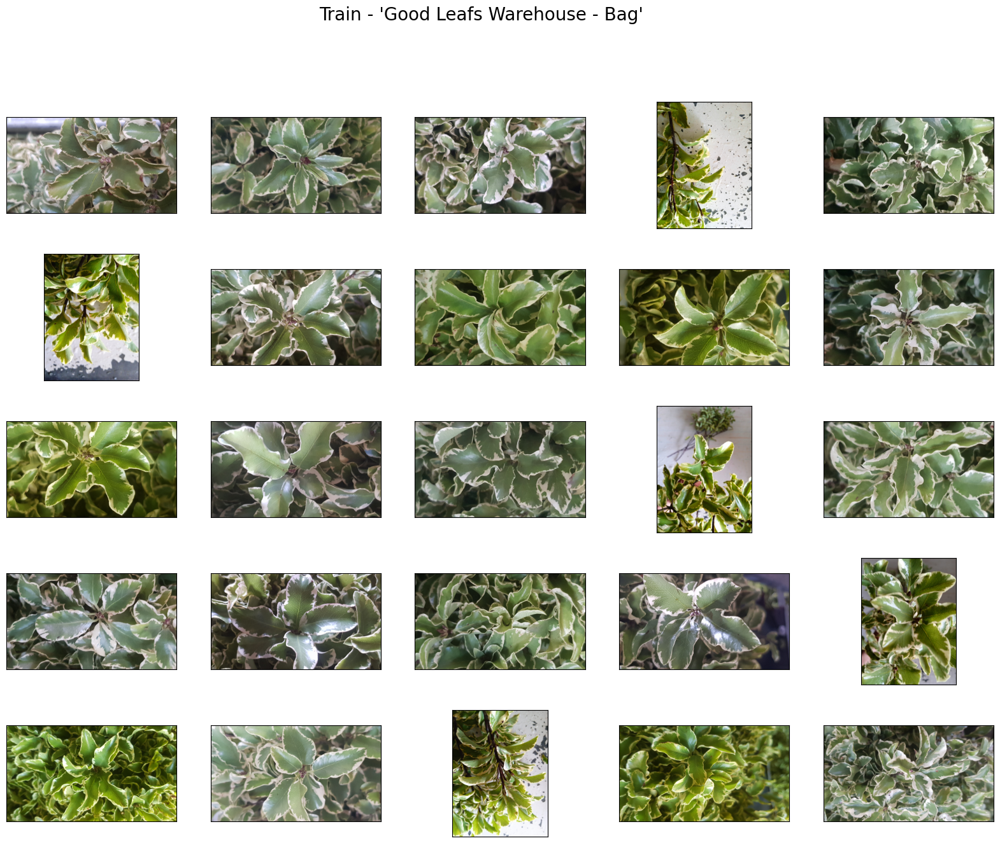

In [20]:
plt.figure(figsize=(20,15))
plt.suptitle("Train - 'Good Leafs Warehouse - Bag' ", fontsize=20)
for i,img in enumerate(os.listdir(os.path.join(train_w_dir, 'Good Leafs Warehouse - Bag'))):
        plt.subplot(5,5,i+1)
        full_image= plt.imread(os.path.join(train_w_dir,'Good Leafs Warehouse - Bag',img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break

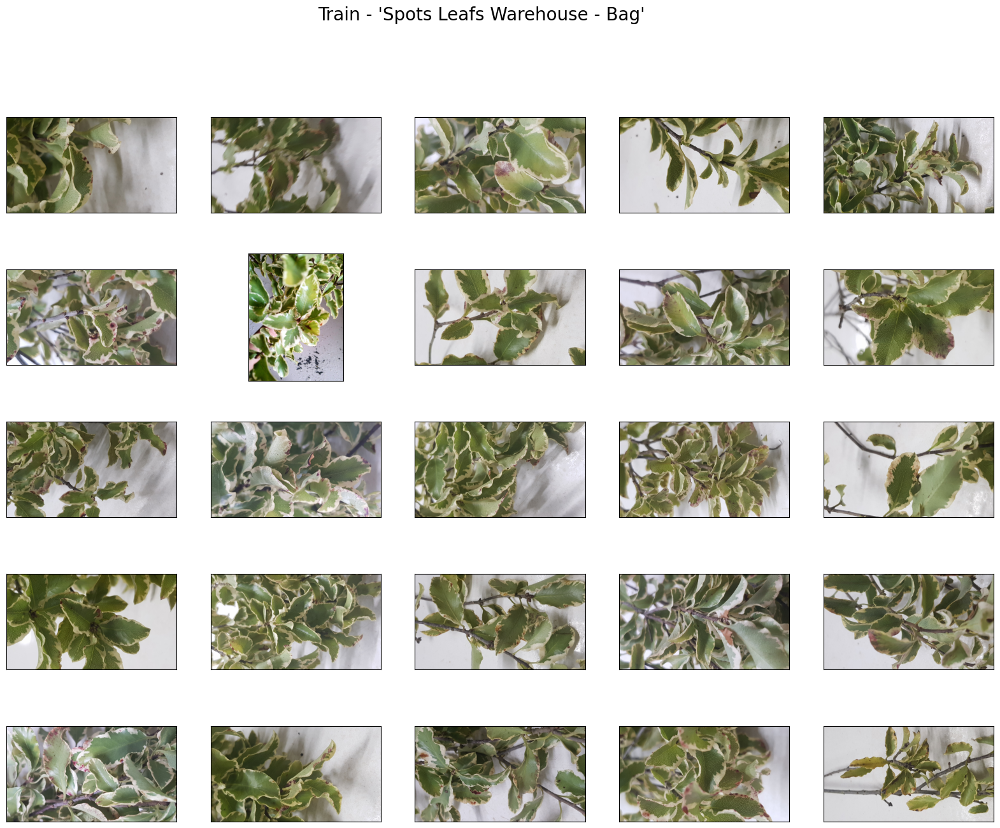

In [21]:
plt.figure(figsize=(20,15))
plt.suptitle("Train - 'Spots Leafs Warehouse - Bag' ", fontsize=20)
for i,img in enumerate(os.listdir(os.path.join(train_w_dir, 'Spots Leafs Warehouse - Bag'))):
        plt.subplot(5,5,i+1)
        full_image= plt.imread(os.path.join(train_w_dir,'Spots Leafs Warehouse - Bag',img))
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(full_image, cmap=plt.cm.binary) 
        if i == 24:
            break

#### 3. Model preparations

##### VGG16

In [107]:
from tensorflow.keras.applications import VGG16
import numpy as np

In [108]:
conv_base = VGG16(weights='imagenet', include_top = False, input_shape = (360,640,3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 360, 640, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 360, 640, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 360, 640, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 180, 320, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 180, 320, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 180, 320, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 90, 160, 128)      0     

##### Data augmentation - checking the train_datagen

In [109]:
train_w_datagen = ImageDataGenerator(
      rescale=1./255,
      #rotation_range=30,
      width_shift_range=1.01,
      height_shift_range=1.01,
      shear_range=1.01,
      zoom_range=[1,1.2],
     # brightness_range = [0.8, 1.2],
      horizontal_flip=True,
      fill_mode='reflect')

##### Plotting the augmented data

/Users/eugeniulitvinenco/Desktop/university/Catolica/2 semester/4 trimester/ATPA/assignment/split_warehouse/train/Good Leafs Warehouse - Bag/20230417_132252.jpg


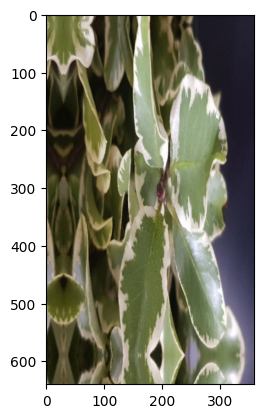

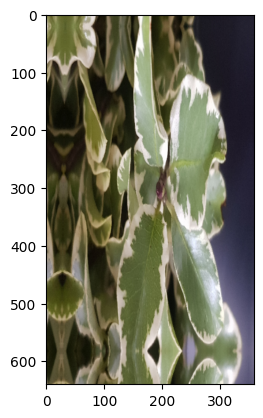

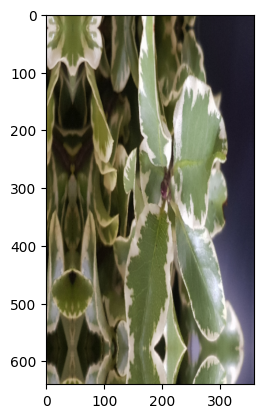

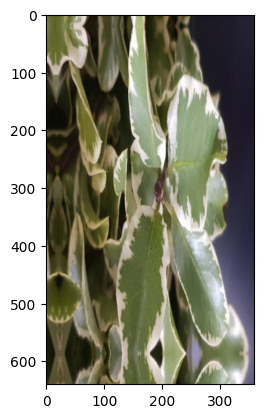

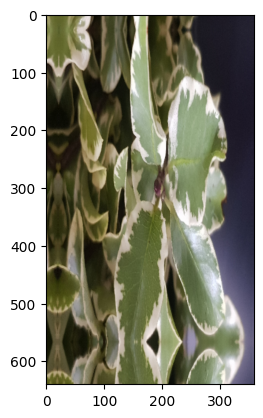

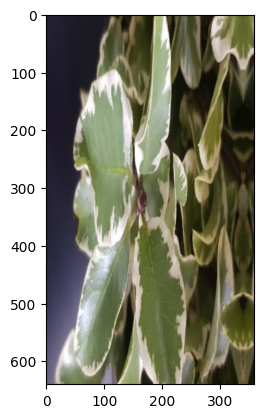

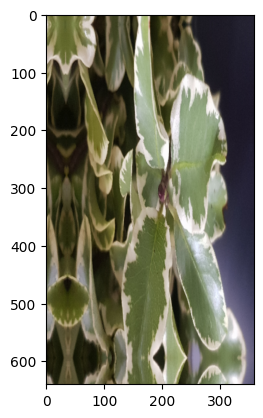

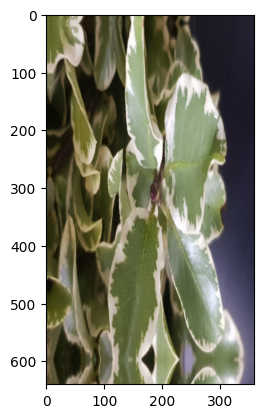

In [112]:
from tensorflow.keras.preprocessing import image
fnames = [os.path.join(train_w_dir, 'Good Leafs Warehouse - Bag', fname) for
     fname in os.listdir(os.path.join(train_w_dir, 'Good Leafs Warehouse - Bag'))]
img_path = fnames[0]
print(img_path)
img = image.load_img(img_path, target_size=(640, 360))
x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)
i = 0
for batch in train_w_datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 8 == 0:
        break
plt.show()

### VGG model + good network + data augmentation + unfreeze the last layer of VGG

In [113]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator


VGG16_model_w = models.Sequential()
VGG16_model_w.add(conv_base)
VGG16_model_w.add(layers.Flatten())
VGG16_model_w.add(layers.Dense(256, activation='relu'))
VGG16_model_w.add(layers.Dense(2, activation='softmax'))


test_w_datagen = ImageDataGenerator(rescale=1./255)

train_w_generator = train_w_datagen.flow_from_directory(
        train_w_dir,
        target_size=(360, 640),
        batch_size=30,
        class_mode='categorical',
        classes = ['Good Leafs Warehouse - Bag', 'Spots Leafs Warehouse - Bag'])

validation_w_generator = test_w_datagen.flow_from_directory(
        val_w_dir,
        target_size=(360, 640),
        batch_size=30,
        class_mode='categorical',
        classes = ['Good Leafs Warehouse - Bag', 'Spots Leafs Warehouse - Bag'])

conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False
        

VGG16_model_w.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=0.0001),
              metrics=['acc'])


# number of samples in the training and validation sets
train_samples = len(train_w_generator.filenames)
val_samples = len(validation_w_generator.filenames)

# Set the batch size
batch_size = 30

# Calculation of the the steps per epoch and validation steps
steps_per_epoch = train_samples // batch_size
validation_steps = val_samples // batch_size

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the callbacks
#early_stop = EarlyStopping(monitor='val_acc', patience=5)
model_checkpoint = ModelCheckpoint('best_model_w.h5', 
                                    save_best_only=True, 
                                    monitor='val_acc', 
                                    mode='max', 
                                    verbose=1)

# Train the model
history_VGG16_w = VGG16_model_w.fit(
  train_w_generator,
  steps_per_epoch=steps_per_epoch,      
  epochs=20,
  validation_data=validation_w_generator,
  validation_steps=validation_steps,
  callbacks=[model_checkpoint]
)

Found 289 images belonging to 2 classes.
Found 83 images belonging to 2 classes.
Epoch 1/20
9/9 [==============================] - ETA: 0s - loss: 0.7886 - acc: 0.8185 
Epoch 1: val_acc improved from -inf to 0.86667, saving model to best_model_w.h5
9/9 [==============================] - 174s 20s/step - loss: 0.7886 - acc: 0.8185 - val_loss: 0.3449 - val_acc: 0.8667
Epoch 2/20
9/9 [==============================] - ETA: 0s - loss: 0.3795 - acc: 0.8301 
Epoch 2: val_acc did not improve from 0.86667
9/9 [==============================] - 184s 21s/step - loss: 0.3795 - acc: 0.8301 - val_loss: 0.2667 - val_acc: 0.8667
Epoch 3/20
9/9 [==============================] - ETA: 0s - loss: 0.2214 - acc: 0.9151 
Epoch 3: val_acc improved from 0.86667 to 0.91667, saving model to best_model_w.h5
9/9 [==============================] - 190s 21s/step - loss: 0.2214 - acc: 0.9151 - val_loss: 0.1918 - val_acc: 0.9167
Epoch 4/20
9/9 [==============================] - ETA: 0s - loss: 0.1337 - acc: 0.9498 
E

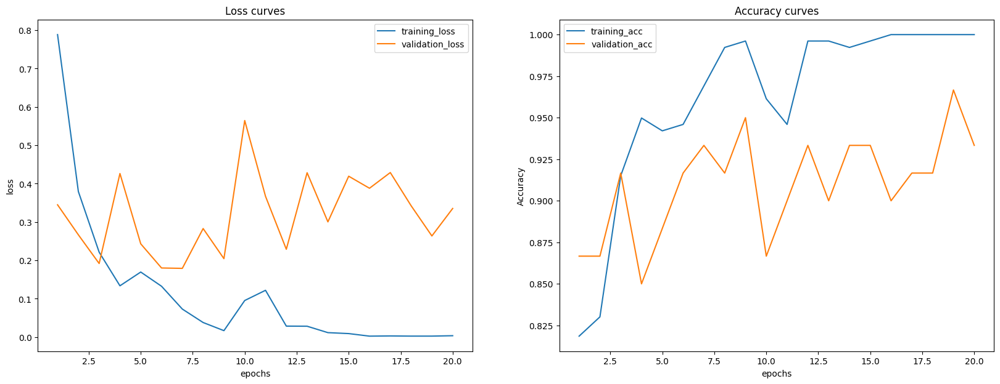

In [114]:
plot_loss_curves(history_VGG16_w)

In [115]:
test_w_generator = test_w_datagen.flow_from_directory(
    test_w_dir,
    target_size=(360, 640),
    batch_size=30,
    classes = ['Good Leafs Warehouse - Bag', 'Spots Leafs Warehouse - Bag'],
    class_mode='categorical')



# Evaluate the model on the test data
test_loss, test_acc = VGG16_model_w.evaluate(test_w_generator, steps=len(test_w_generator))
print('Test accuracy:', test_acc)

Found 42 images belonging to 2 classes.
2/2 [==============================] - 20s 5s/step - loss: 0.7645 - acc: 0.8810
Test accuracy: 0.8809523582458496


In [116]:
from tensorflow.keras.models import load_model
best_model_w = load_model('best_model_w.h5')

In [117]:
# Evaluate the model on the test data
test_loss, test_acc = best_model_w.evaluate(test_w_generator, steps=len(test_w_generator))
print('Test accuracy:', test_acc)

2/2 [==============================] - 21s 5s/step - loss: 0.1325 - acc: 0.9286
Test accuracy: 0.9285714030265808


### Using the second model on the data from the Field

In [ ]:
dir_check = '/Users/eugeniulitvinenco/Desktop/check'

In [ ]:
test_w_generator = test_w_datagen.flow_from_directory(
    dir_check,
    target_size=(360, 640),
    batch_size=30,
    classes = ['Good Leafs Warehouse - Bag', 'Spots Leafs Warehouse - Bag'],
    class_mode='categorical')

Found 22 images belonging to 2 classes.


In [ ]:
# Evaluate the model on the test data
test_loss, test_acc = best_model_w.evaluate(test_w_generator, steps=len(test_w_generator))
print('Test accuracy:', test_acc)

1/1 [==============================] - 10s 10s/step - loss: 1.2664 - acc: 0.7273
Test accuracy: 0.7272727489471436
